In [32]:
import json
import os
from collections import Counter
import cv2
import matplotlib.pyplot as plt
import numpy as np

labels_base = "/home/kkp3kor/2025/bdk_object_detection/data/bdd100k_labels_release/bdd100k/labels"
with open(os.path.join(labels_base, "bdd100k_labels_images_val.json"), 'r') as f:
    data = json.load(f)
for i, item in enumerate(data):
    print(item)
    break

{'name': 'b1c66a42-6f7d68ca.jpg', 'attributes': {'weather': 'overcast', 'scene': 'city street', 'timeofday': 'daytime'}, 'timestamp': 10000, 'labels': [{'category': 'traffic sign', 'attributes': {'occluded': False, 'truncated': False, 'trafficLightColor': 'none'}, 'manualShape': True, 'manualAttributes': True, 'box2d': {'x1': 1000.698742, 'y1': 281.992415, 'x2': 1040.626872, 'y2': 326.91156}, 'id': 0}, {'category': 'traffic sign', 'attributes': {'occluded': False, 'truncated': False, 'trafficLightColor': 'none'}, 'manualShape': True, 'manualAttributes': True, 'box2d': {'x1': 214.613695, 'y1': 172.190058, 'x2': 274.505889, 'y2': 229.586743}, 'id': 1}, {'category': 'traffic sign', 'attributes': {'occluded': False, 'truncated': False, 'trafficLightColor': 'none'}, 'manualShape': True, 'manualAttributes': True, 'box2d': {'x1': 797.314833, 'y1': 313.186265, 'x2': 829.756437, 'y2': 341.884608}, 'id': 2}, {'category': 'traffic sign', 'attributes': {'occluded': False, 'truncated': False, 'traf

In [29]:
class BDDDatasetExplorer:
    def __init__(self, annotation_path):
        """
        Initialize the dataset explorer.
        Args
            annotation_path: Path to the JSON annotation file.
        """
        self.annotation_path = annotation_path
        self.data = self._load_annotations()
        self.count_instances()
    
    def _load_annotations(self):
        """Load JSON annotations from file."""
        with open(self.annotation_path, 'r') as f:
            return json.load(f)
    
    def count_instances(self):
        """Count occurrences of each object class in the dataset."""
        class_counter = Counter()
        weather_counter = Counter()
        scene_counter = Counter()
        time_counter = Counter()
        occluded_counter = Counter()
        truncated_counter = Counter()
        
        bbox_counts = []
        for item in self.data:
            weather_counter[item["attributes"]["weather"]] += 1
            scene_counter[item["attributes"]["scene"]] += 1
            time_counter[item["attributes"]["timeofday"]] += 1
            box_count = 0
            for label in item['labels']:
                if 'category' in label and "box2d" in label:
                    class_counter[label['category']] += 1
                    box_count += 1
                if "attributes" in label:
                    attributes = label["attributes"]
                    if "occluded" in attributes:
                        value = 1 if attributes["occluded"] else 0
                        occluded_counter[label['category']] += value
                    if "truncated" in attributes:
                        value = 1 if attributes["truncated"] else 0
                        truncated_counter[label['category']] += value
            bbox_counts.append(box_count)
            
        
        self.weather_counter = weather_counter
        self.scene_counter = scene_counter
        self.time_counter = time_counter
        self.class_counter = class_counter
        self.occluded_counter = occluded_counter
        self.truncated_counter = truncated_counter
        self.bbox_counts = bbox_counts
    
def visualize_bar_plot(class_counts, name="Object Class", save_path=None):
    """Plot the distribution as a bar chart."""
    sorted_classes = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)
    classes, counts = zip(*sorted_classes)

    plt.figure(figsize=(10, 5))
    plt.bar(classes, counts, color='skyblue')
    plt.xlabel(name)
    plt.ylabel('Instance Count')
    plt.title(f'BDD Object Detection {name} Distribution')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=dpi)
        print(f"Figure saved to: {save_path}")
    plt.show()
    
def visualize_hist_distribution(boxes_list, save_path=None):
    """distribution using histogram plot"""
    plt.hist(boxes_list, bins=range(max(boxes_list) + 2))  # +2 so the last bin is included
    plt.title("Number of Bounding Boxes Per Image (BDD)")
    plt.xlabel("Number of boxes")
    plt.ylabel("Number of images")
    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=dpi)
        print(f"Figure saved to: {save_path}")
    plt.show()

In [27]:
train_paths = "/home/kkp3kor/2025/bdk_object_detection/data/bdd100k_images_100k/bdd100k/images/100k/train"
val_paths = "/home/kkp3kor/2025/bdk_object_detection/data/bdd100k_images_100k/bdd100k/images/100k/val"
labels_base = "/home/kkp3kor/2025/bdk_object_detection/data/bdd100k_labels_release/bdd100k/labels"
train_explorer = BDDDatasetExplorer(os.path.join(labels_base, "bdd100k_labels_images_train.json"))
val_explorer = BDDDatasetExplorer(os.path.join(labels_base, "bdd100k_labels_images_val.json"))

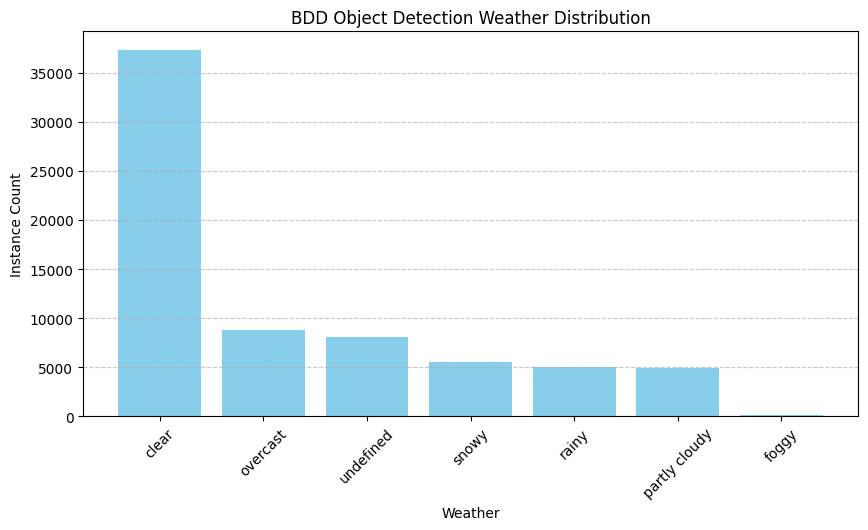

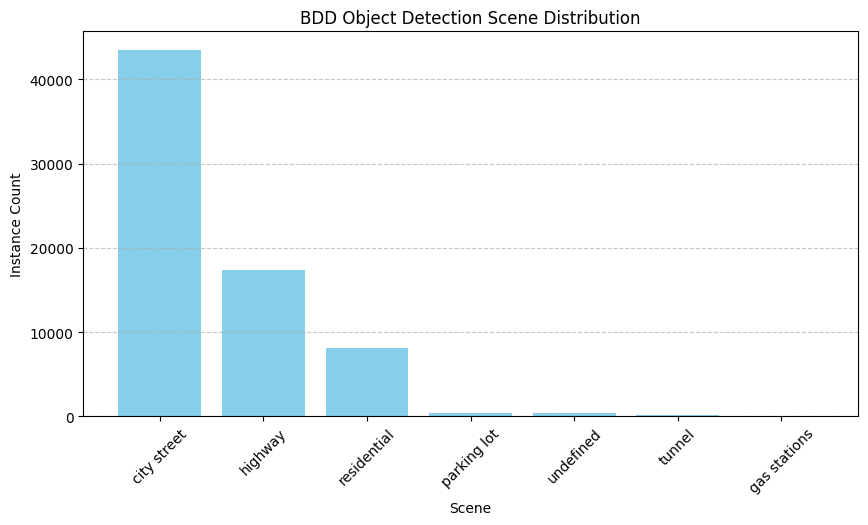

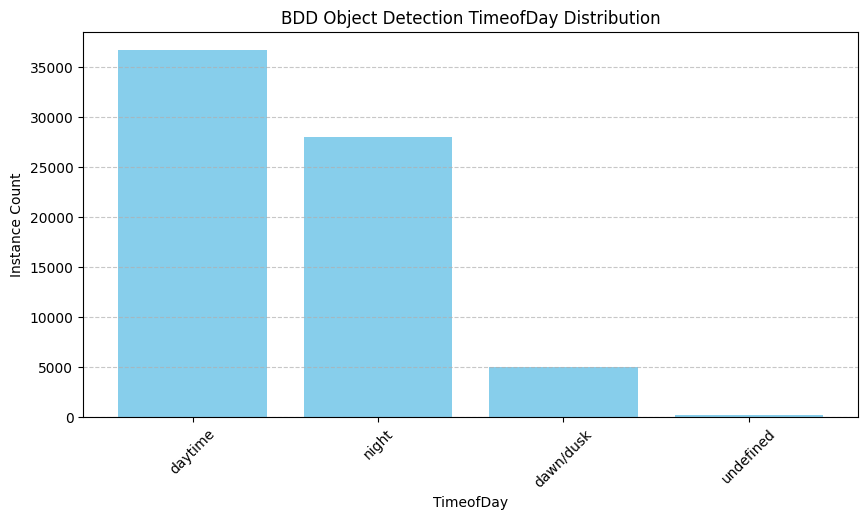

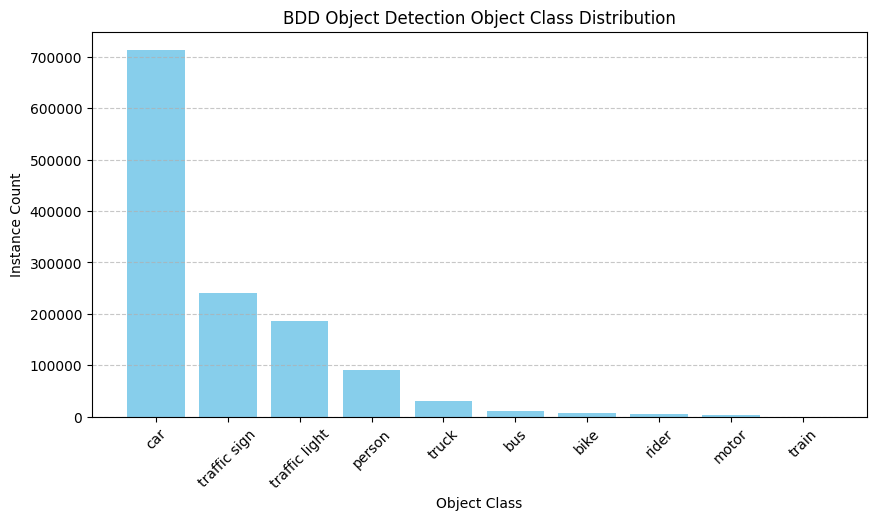

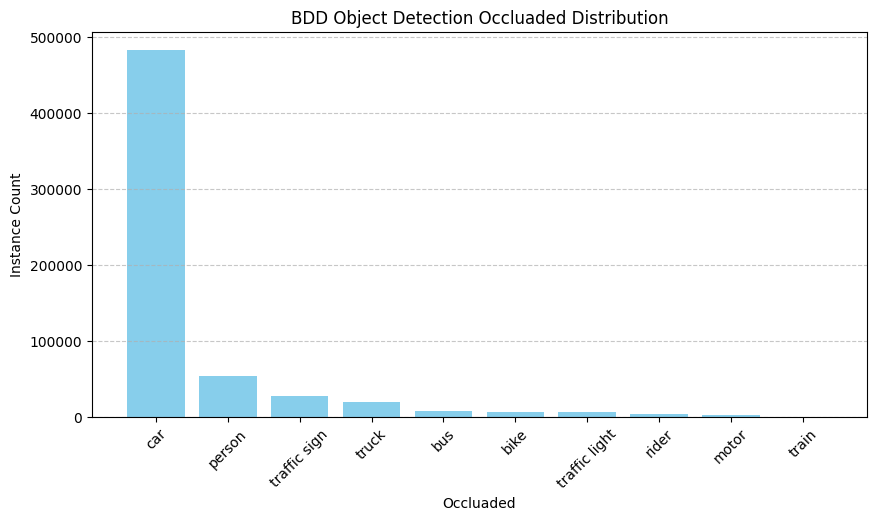

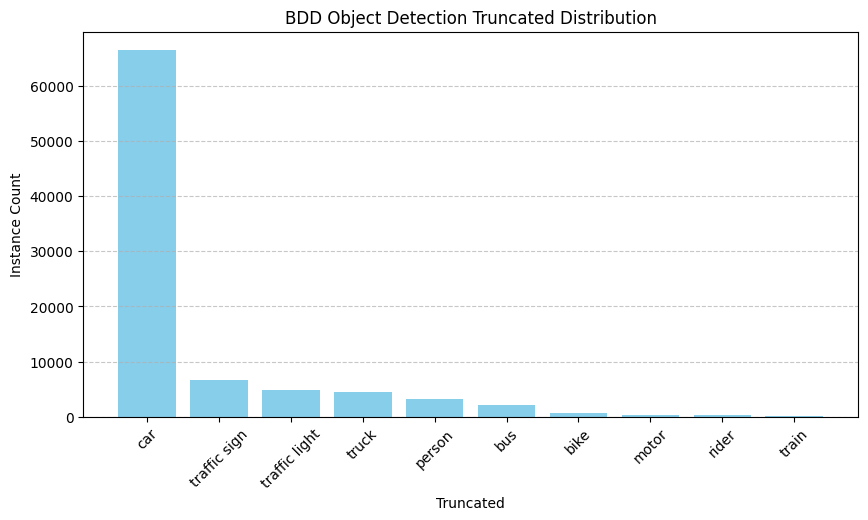

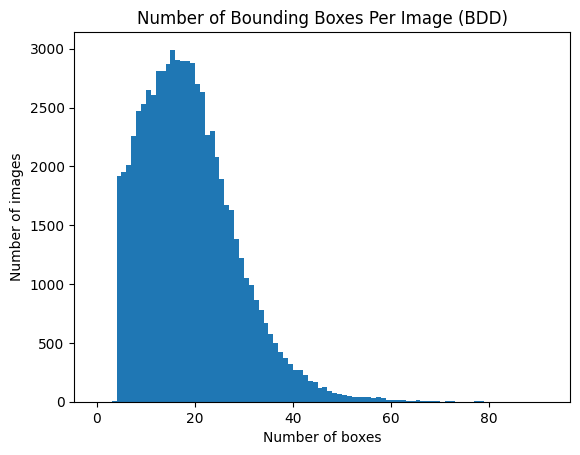

In [31]:
visualize_bar_plot(train_explorer.weather_counter, name="Weather")
visualize_bar_plot(train_explorer.scene_counter, name="Scene")
visualize_bar_plot(train_explorer.time_counter, name="TimeofDay")
visualize_bar_plot(train_explorer.class_counter)
visualize_bar_plot(train_explorer.occluded_counter, name="Occluaded")
visualize_bar_plot(train_explorer.truncated_counter, name="Truncated")
visualize_hist_distribution(train_explorer.bbox_counts)

In [15]:


def normalize(counter):
    total = sum(counter.values())
    return {cls: count / total for cls, count in counter.items()}

def overlay_distributions(dist1, dist2, label1='Train', label2='Validation', title='Weather Distribution'):
    # Get all unique classes
    dist1 = normalize(dist1)
    dist2 = normalize(dist2)
    all_keys = sorted(set(dist1.keys()).union(set(dist2.keys())))
    
    # Fetch values or 0 if not present
    values1 = [dist1.get(k, 0) for k in all_keys]
    values2 = [dist2.get(k, 0) for k in all_keys]

    x = np.arange(len(all_keys))
    width = 0.35

    plt.figure(figsize=(10, 5))
    plt.bar(x - width/2, values1, width, label=label1, alpha=0.7)
    plt.bar(x + width/2, values2, width, label=label2, alpha=0.7)

    plt.xlabel('Category')
    plt.ylabel('Normalized Frequency')
    plt.title(title)
    plt.xticks(ticks=x, labels=all_keys, rotation=45)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

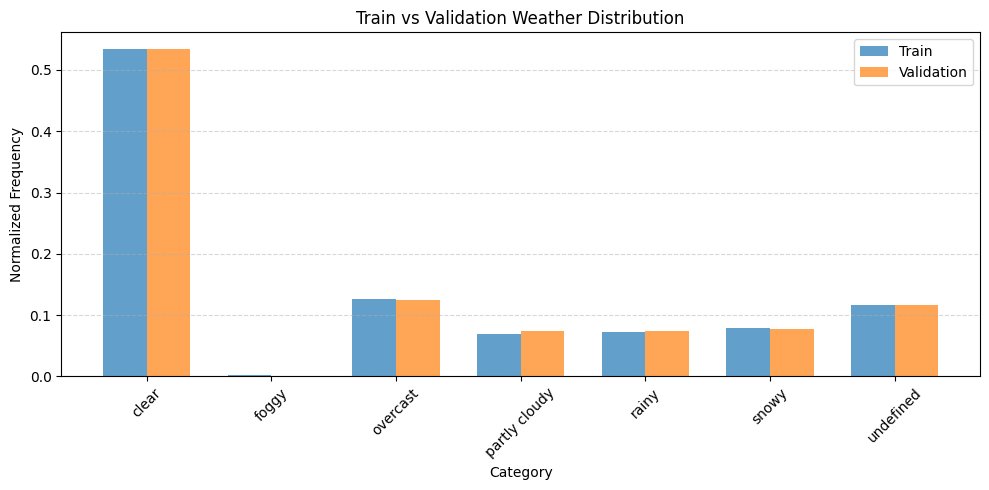

In [16]:
overlay_distributions(train_explorer.weather_counter, val_explorer.weather_counter, 
                      label1='Train', label2='Validation', 
                      title='Train vs Validation Weather Distribution')

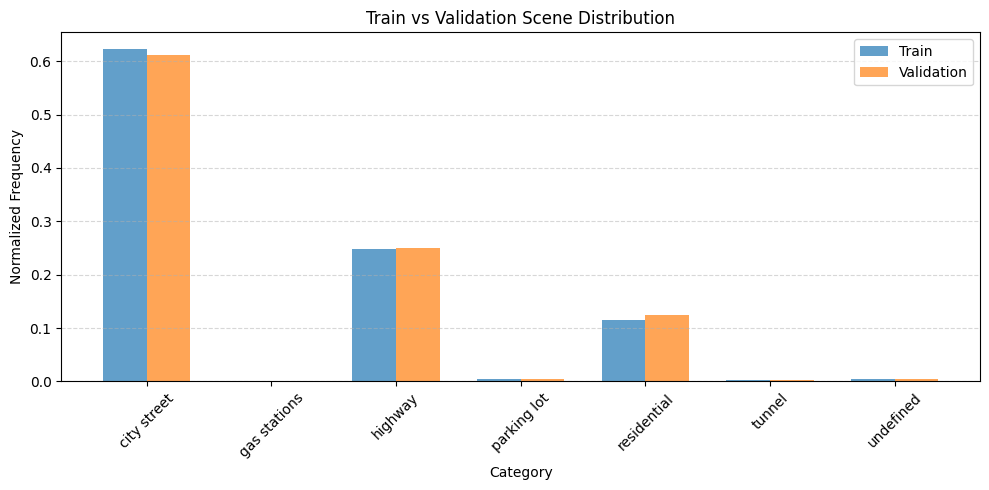

In [17]:
overlay_distributions(train_explorer.scene_counter, val_explorer.scene_counter, 
                      label1='Train', label2='Validation', 
                      title='Train vs Validation Scene Distribution')

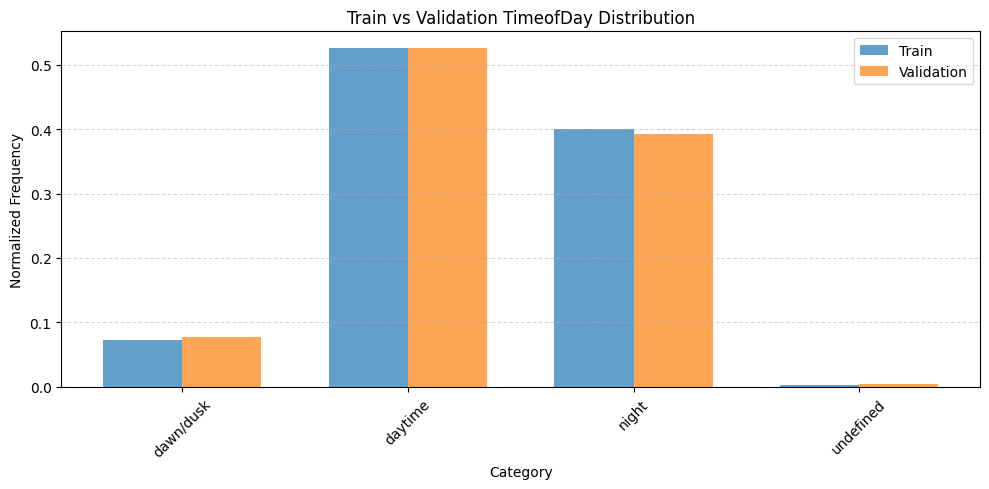

In [18]:
overlay_distributions(train_explorer.time_counter, val_explorer.time_counter, 
                      label1='Train', label2='Validation', 
                      title='Train vs Validation TimeofDay Distribution')

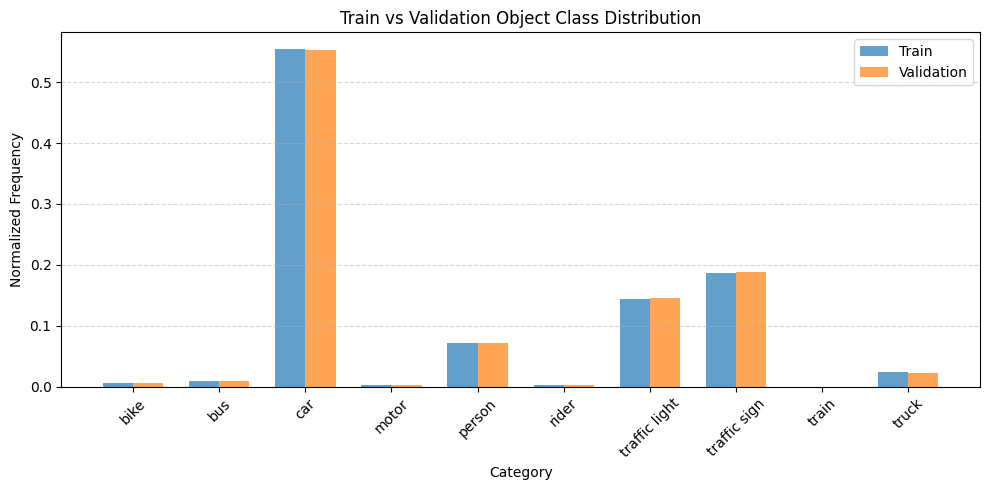

In [19]:
overlay_distributions(train_explorer.class_counter, val_explorer.class_counter, 
                      label1='Train', label2='Validation', 
                      title='Train vs Validation Object Class Distribution')

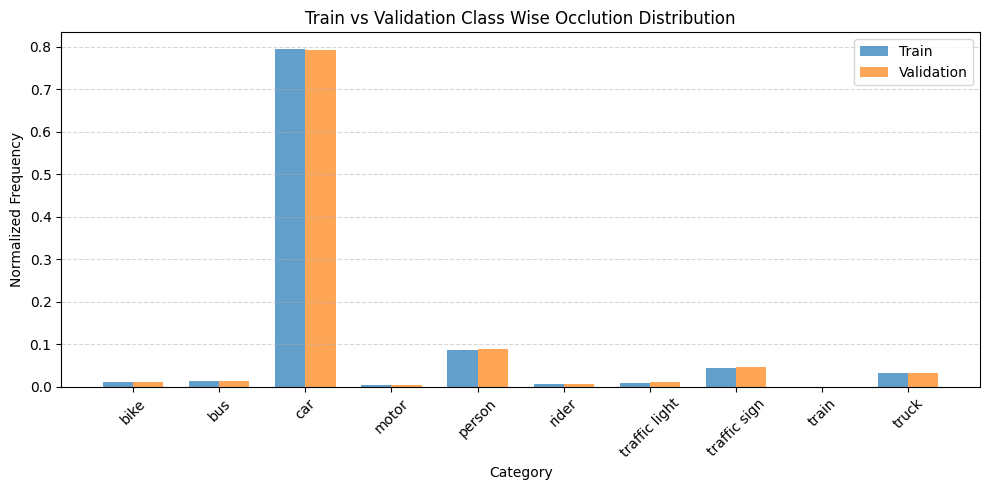

In [20]:
overlay_distributions(train_explorer.occluded_counter, val_explorer.occluded_counter, 
                      label1='Train', label2='Validation', 
                      title='Train vs Validation Class Wise Occlution Distribution')

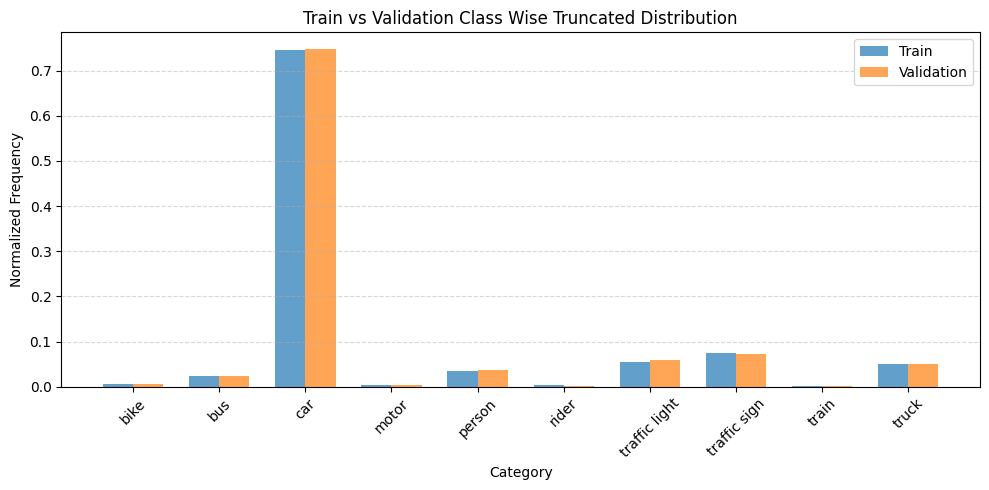

In [21]:
overlay_distributions(train_explorer.truncated_counter, val_explorer.truncated_counter, 
                      label1='Train', label2='Validation', 
                      title='Train vs Validation Class Wise Truncated Distribution')

In [24]:

def overlay_box_distribution(train_bbox_counts, val_bbox_counts, bins='auto', max_bin=100):
    """
    Overlay histograms of bounding box count per image for train and validation sets.

    Args:
        train_bbox_counts (list): List of box counts for train images.
        val_bbox_counts (list): List of box counts for val images.
        bins (int or str): Number of bins or 'auto' for auto binning.
        max_bin (int): Max x-axis value to show.
    """
    max_val = min(max(max(train_bbox_counts), max(val_bbox_counts)), max_bin)

    plt.figure(figsize=(10, 5))
    plt.hist(train_bbox_counts, bins=range(0, max_val + 2), alpha=0.6, label='Train', color='skyblue')
    plt.hist(val_bbox_counts, bins=range(0, max_val + 2), alpha=0.6, label='Validation', color='orange')

    plt.title("Bounding Box Count Per Image: Train vs Validation")
    plt.xlabel("Number of Bounding Boxes")
    plt.ylabel("Number of Images")
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

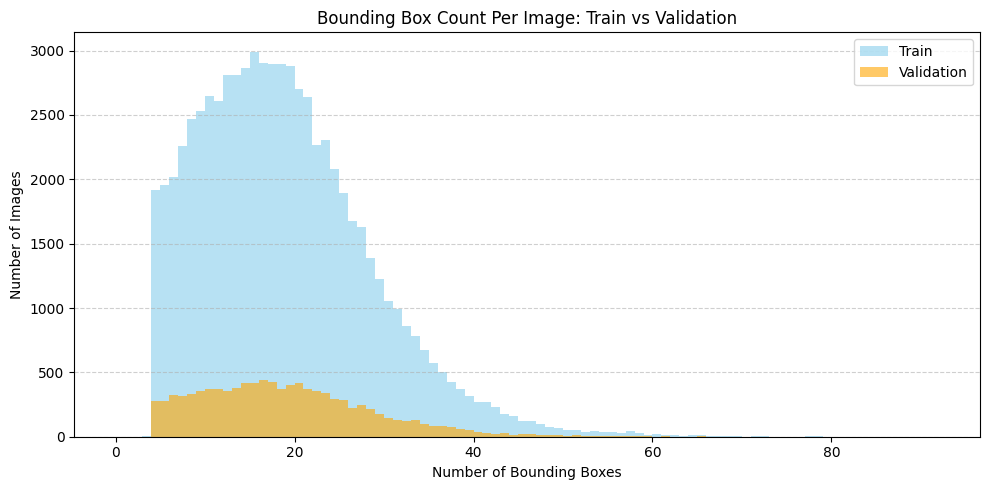

In [25]:
overlay_box_distribution(train_explorer.bbox_counts, val_explorer.bbox_counts)

In [35]:
def get_images_by_bbox_thresholds(data, low_threshold=5, high_threshold=100):
        """
        Return two lists of image names (or indices):
          1) images that have fewer than 'low_threshold' bounding boxes
          2) images that have more than 'high_threshold' bounding boxes

        Args:
            low_threshold (int): The upper bound for "few" bounding boxes.
            high_threshold (int): The lower bound for "many" bounding boxes.

        Returns:
            images_with_few (list), images_with_many (list)
        """
        images_with_few = []
        images_with_many = []
        
        for i, item in enumerate(data):
            image_identifier = item.get('name', f'Image_{i}')  
            
            bboxes = []
            labels = item.get('labels', [])
            for label in labels:
                if 'box2d' in label:
                    box = label['box2d']
                    x1, y1, x2, y2 = int(box['x1']), int(box['y1']), int(box['x2']), int(box['y2'])
                    category = label.get('category', 'unknown')
                    bboxes.append((x1, y1, x2, y2, category))

            image_info = {
                "image_name": image_identifier,
                "bboxes": bboxes
            }
            num_bboxes = len(bboxes)
            
            if num_bboxes < low_threshold:
                images_with_few.append(image_info)
            elif num_bboxes > high_threshold:
                images_with_many.append(image_info)
        
        return images_with_few, images_with_many

In [36]:
def show_images_with_boxes(images_info_list, image_dir, title=None, max_images=3):
    """
    Load images, draw bounding boxes, and display them with an optional title.

    Args:
        images_info_list (list): List of dicts, each like:
            {
              "image_name": <str>,
              "bboxes": [ (x1, y1, x2, y2, category), ... ]
            }
        image_dir (str): Path to the folder containing the images.
        title (str): Optional title for the whole figure.
        max_images (int): Max number of images to display (default is 3).
    """
    num_images = min(len(images_info_list), max_images)
    fig, axes = plt.subplots(1, num_images, figsize=(5 * num_images, 5))
    axes = axes if isinstance(axes, (list, np.ndarray)) else [axes]

    for idx in range(num_images):
        img_info = images_info_list[idx]
        image_path = os.path.join(image_dir, img_info["image_name"])
        image = cv2.imread(image_path)
        if image is None:
            print(f"Could not load image: {image_path}")
            axes[idx].axis('off')
            continue

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        for (x1, y1, x2, y2, category) in img_info["bboxes"]:
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image, category, (x1, max(y1 - 5, 0)), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

        axes[idx].imshow(image)
        axes[idx].set_title(img_info['image_name'])
        axes[idx].axis('off')

    for j in range(num_images, len(axes)):
        axes[j].axis('off')

    if title:
        fig.suptitle(title, fontsize=16)

    plt.tight_layout()
    plt.show()

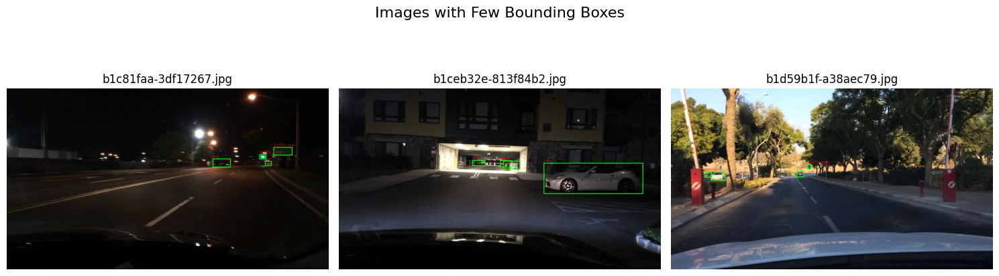

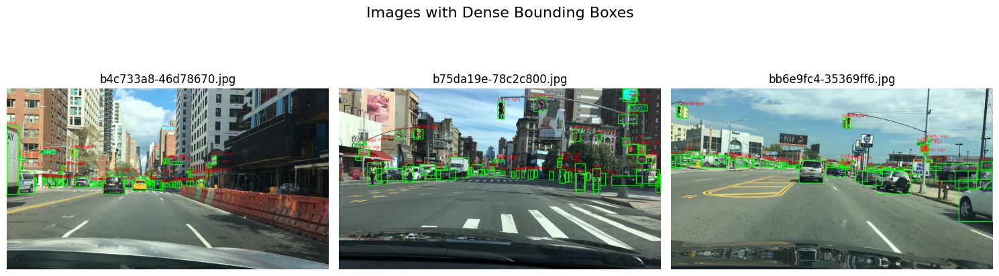

In [37]:
sparse_box_images, dense_box_images = get_images_by_bbox_thresholds(val_explorer.data, low_threshold=5, high_threshold=63)
show_images_with_boxes(sparse_box_images[:3], val_paths, title="Valid Images with Few Bounding Boxes")
show_images_with_boxes(dense_box_images[:3], val_paths, title="Valid Images with Dense Bounding Boxes")

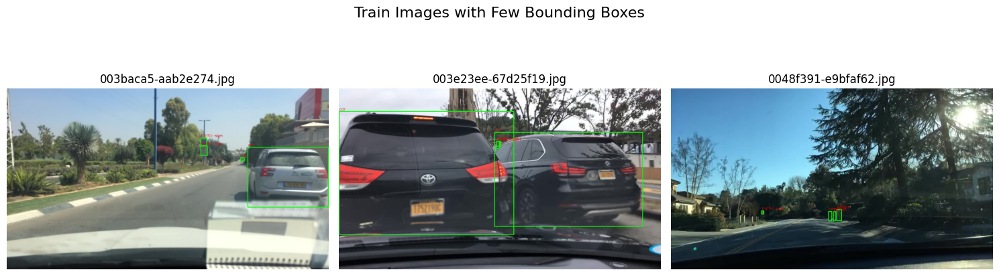

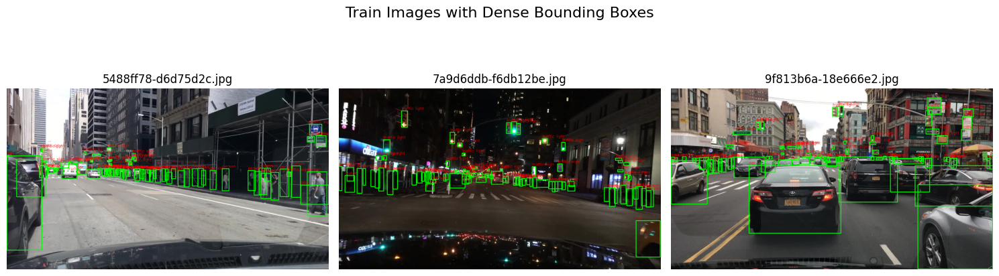

In [39]:
sparse_box_images, dense_box_images = get_images_by_bbox_thresholds(train_explorer.data, low_threshold=5, high_threshold=84)
show_images_with_boxes(sparse_box_images[:3], train_paths, title="Train Images with Few Bounding Boxes")
show_images_with_boxes(dense_box_images[:3], train_paths, title="Train Images with Dense Bounding Boxes")

In [50]:
def extract_info(indices, image_names, boxes, class_name):
    """Helper to wrap image info and bbox into display-ready format."""
    return [{
        "image_name": image_names[i],
        "bboxes": [boxes[i] + (class_name, )]
    } for i in indices]


class ClassAnalyzer:
    def __init__(self, data, image_dir=None):
        """
        Initialize the analyzer.

        Args:
            data (list): JSON data list from BDD.
            image_dir (str): Path to image directory for visualizations.
        """
        self.data = data
        self.image_dir = image_dir

    def analyze(self, target_class='car', show_top_bottom=3, show_images=True):
        """
        Analyze width, height, and area for a given object class.

        Args:
            target_class (str): Object category to analyze.
            show_top_bottom (int): Number of extreme cases to visualize.
            show_images (bool): Whether to display images with boxes.

        Returns:
            result (dict)
        """
        image_names, boxes = [], []
        widths, heights, areas = [], [], []

        for item in self.data:
            img_name = item.get('name')
            for label in item.get('labels', []):
                if label.get('category') == target_class and 'box2d' in label:
                    box = label['box2d']
                    x1, y1 = int(box['x1']), int(box['y1'])
                    x2, y2 = int(box['x2']), int(box['y2'])
                    width, height = abs(x2 - x1), abs(y2 - y1)
                    area = width * height

                    image_names.append(img_name)
                    boxes.append((x1, y1, x2, y2))
                    widths.append(width)
                    heights.append(height)
                    areas.append(area)

        self._plot_distributions(widths, heights, areas, target_class)

        result = {
            "image_names": image_names,
            "boxes": boxes,
            "widths": widths,
            "heights": heights,
            "areas": areas,
            "anomalies": []
        }

        if show_images and self.image_dir:
            self._show_extremes(image_names, boxes, widths, "Width", target_class, show_top_bottom)
            self._show_extremes(image_names, boxes, heights, "Height", target_class, show_top_bottom)
            self._show_extremes(image_names, boxes, areas, "Area", target_class, show_top_bottom)

        return 0

    def _plot_distributions(self, widths, heights, areas, class_name):
        """Plot width, height, and area histograms."""
        fig, axs = plt.subplots(1, 3, figsize=(15, 4))
        fig.suptitle(f"Distribution for Class: '{class_name}'")

        axs[0].hist(widths, bins=30, color='skyblue')
        axs[0].set_title('Width Distribution')

        axs[1].hist(heights, bins=30, color='orange')
        axs[1].set_title('Height Distribution')

        axs[2].hist(areas, bins=30, color='green')
        axs[2].set_title('Area Distribution')

        plt.tight_layout()
        plt.show()

    def _show_extremes(self, image_names, boxes, values, metric, class_name, k=3):
        """Show top-k and bottom-k images for a metric (width, height, area)."""
        top_k_idx = np.argsort(values)[-k:]
        bottom_k_idx = np.argsort(values)[:k]

        top_k_images = extract_info(top_k_idx, image_names, boxes, class_name)
        bottom_k_images = extract_info(bottom_k_idx, image_names, boxes, class_name)

        show_images_with_boxes(top_k_images, self.image_dir, title=f"Top {k} {class_name}s  with Large {metric} Boxes")

        show_images_with_boxes(bottom_k_images, self.image_dir, title=f"Top {k} {class_name}s  with Small {metric} Boxes")

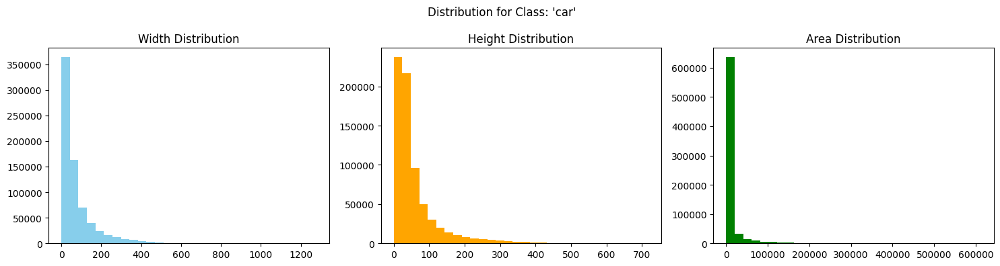

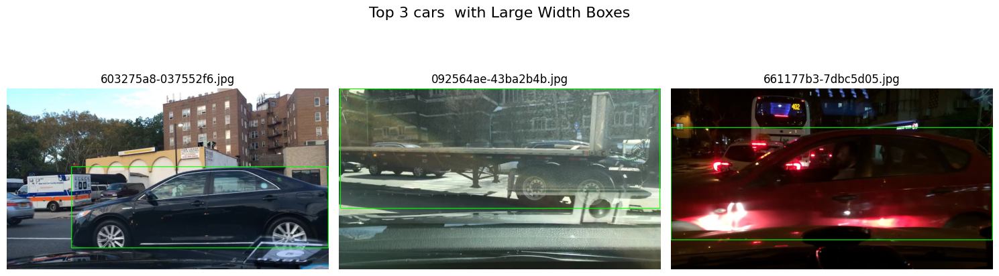

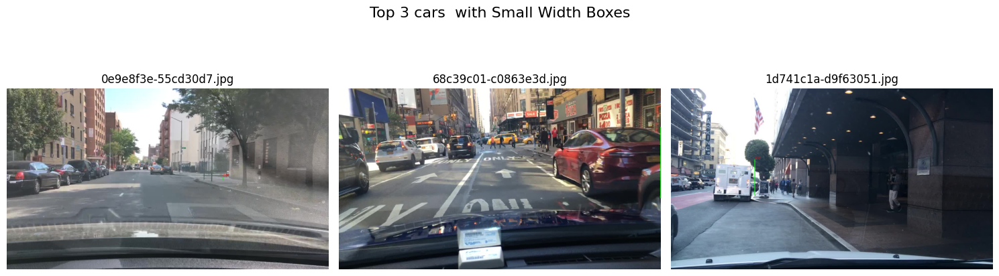

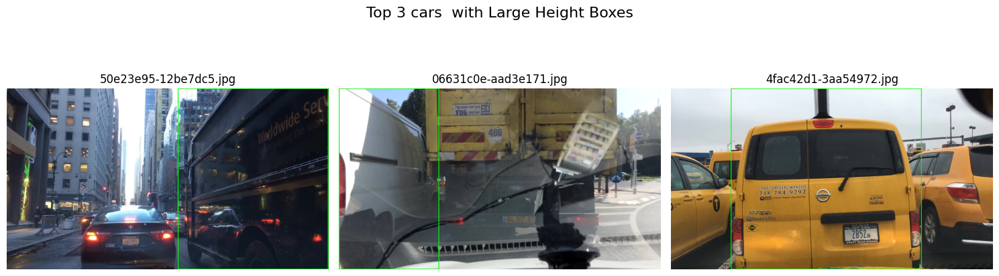

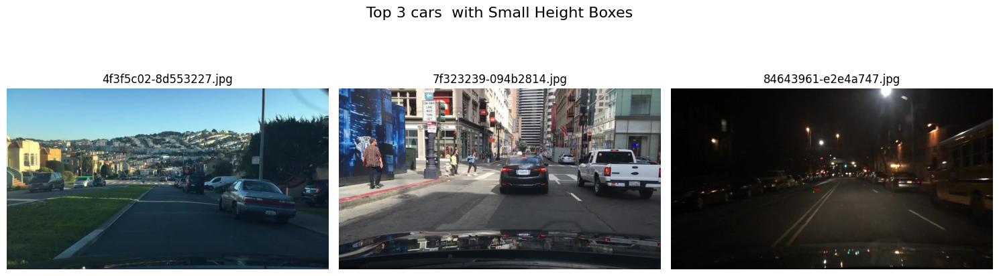

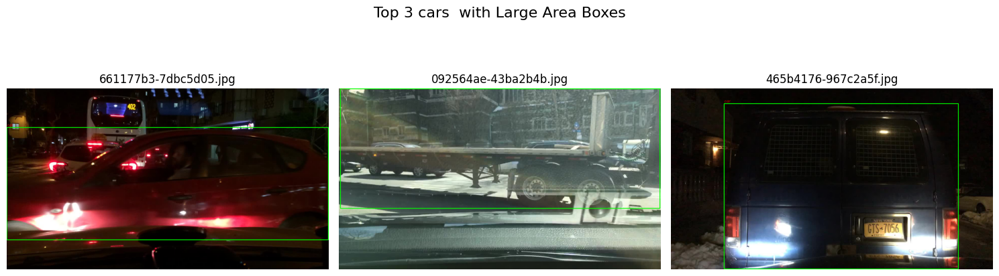

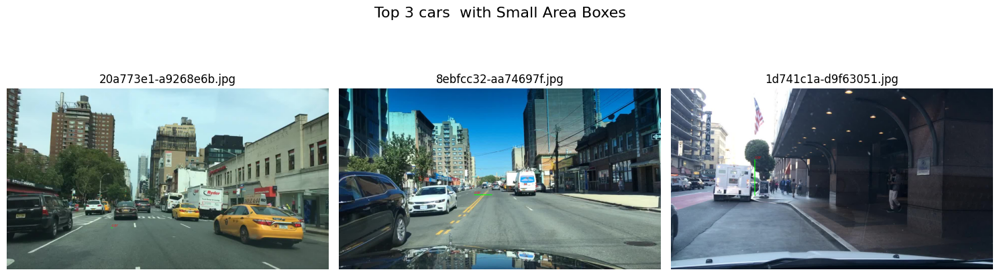

0

In [51]:
class_obj = ClassAnalyzer(train_explorer.data, train_paths)
class_obj.analyze(target_class="car")

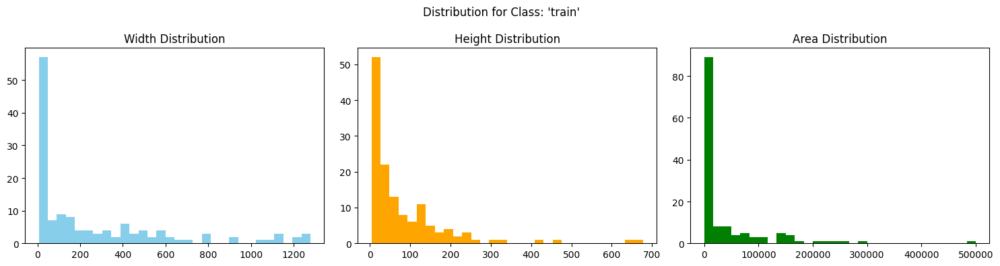

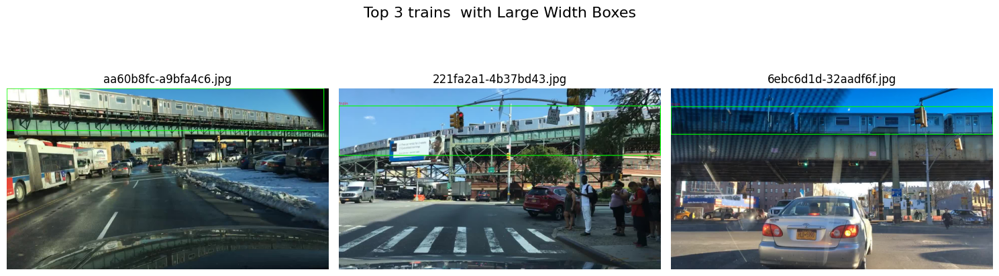

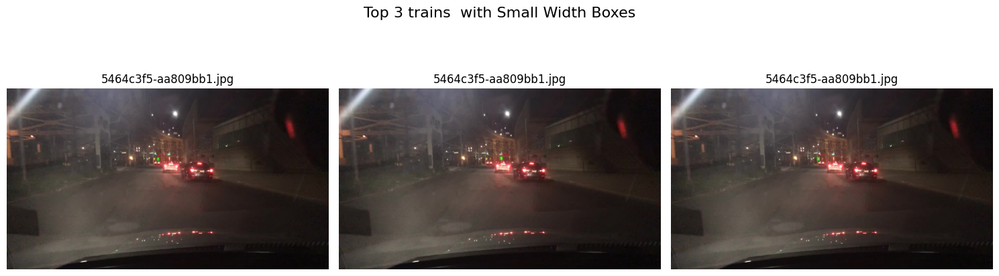

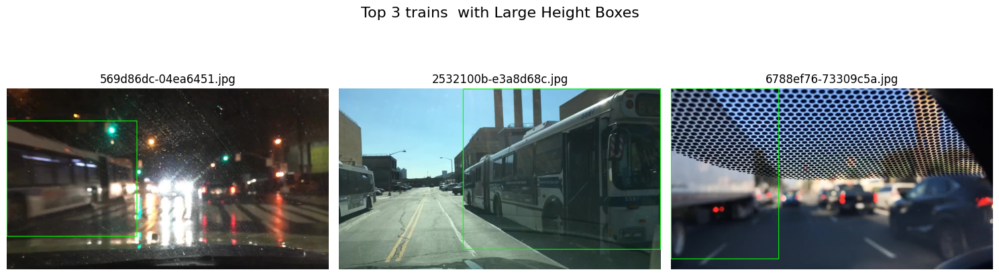

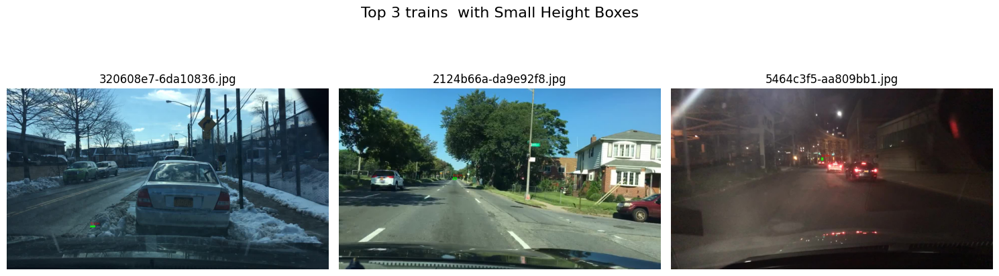

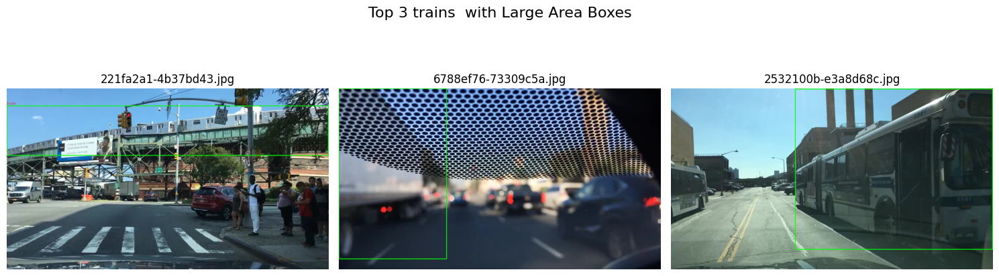

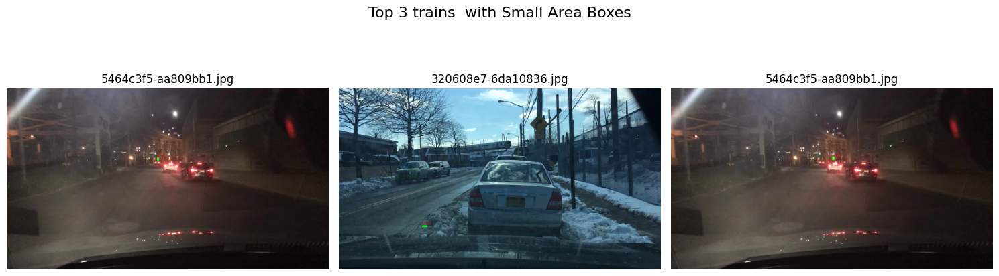

0

In [52]:
class_obj.analyze(target_class="train")

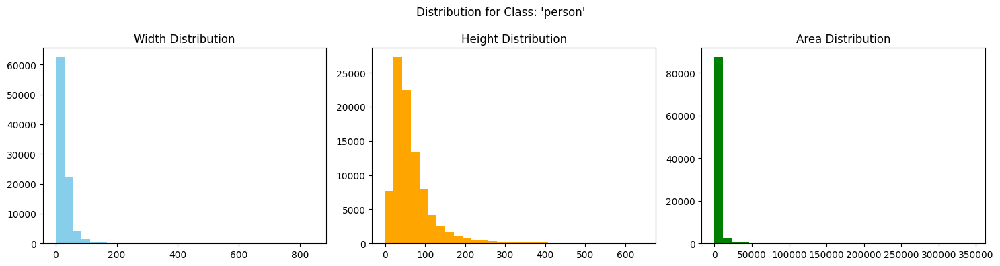

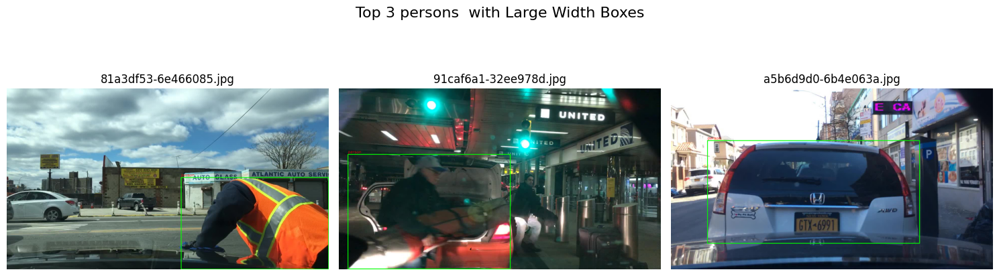

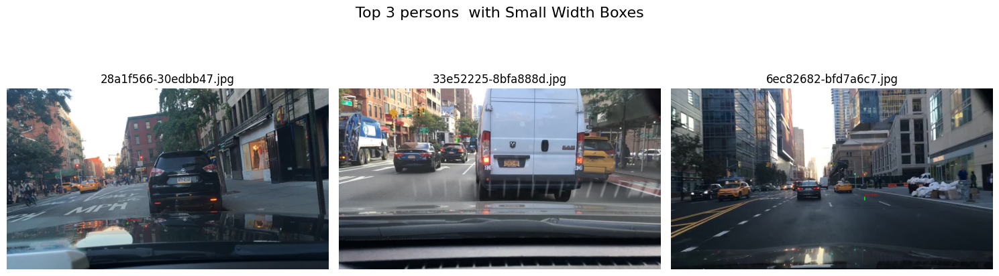

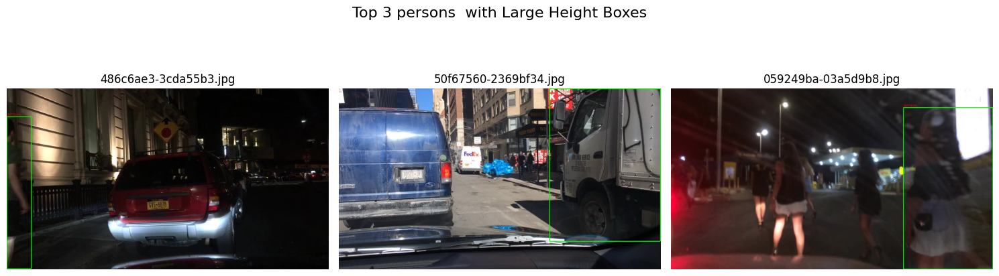

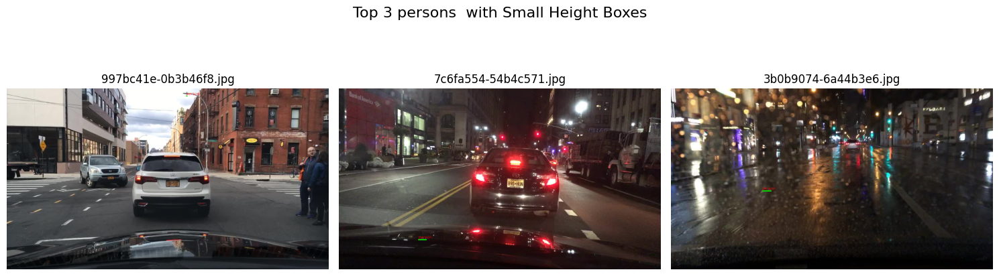

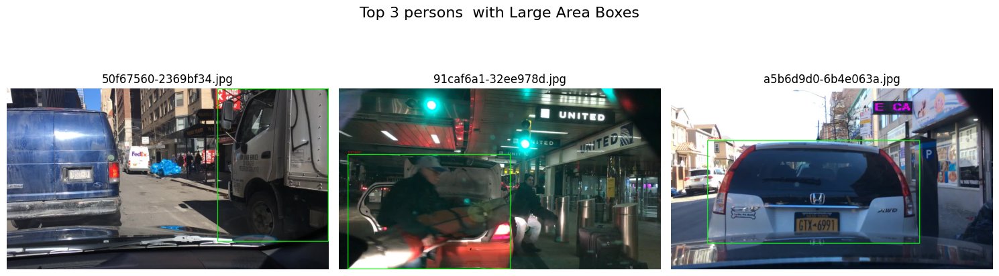

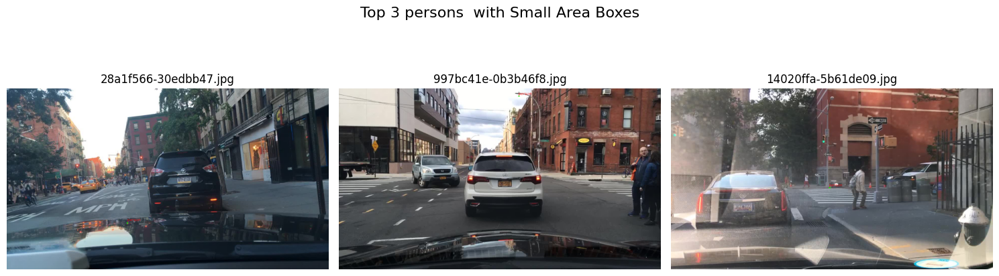

0

In [55]:
class_obj.analyze(target_class="person")